# SETUP

## Check environment

In [1]:
USE_GPU = True

## Libraries

In [2]:
# System
import os
import glob
import shutil
import copy
import re
from datetime import datetime
import logging
import sys

# Data
import numpy as np
import pandas as pd

# Visualization
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

# Data processing
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, TimeSeriesSplit, cross_val_score
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
import joblib

# Model
import tensorflow as tf
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, root_mean_squared_error, mean_absolute_percentage_error
from scipy.stats import pearsonr
from keras import Input, Model, Sequential
from keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Dropout, GRU, Conv1D, MaxPooling1D, Flatten
from keras.utils import plot_model
from keras.saving import load_model
from keras.callbacks import LearningRateScheduler, ModelCheckpoint, EarlyStopping
from keras.optimizers import Adam
from keras.losses import MeanAbsoluteError
from keras.losses import MeanAbsoluteError, MeanSquaredError
import keras.backend as K
from tqdm.keras import TqdmCallback
from tensorflow.keras import optimizers

# Append the custom libraries to system path
sys.path.append("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project")

# Configure device
if not USE_GPU:
    print("Using CPU to train")
    os.environ['CUDA_VISIBLE_DEVICES'] = '-1'
else:
    print("Using GPU to train")

# Custom libraries written by myself
from src.plot import plot_1_data, plot_2_data, plot_3_data, plot_prediction, plot_learning_curves
from src.reduction_model.lstm_s2s import LSTMSeq2SeqReduction
from src.reduction_model.gru_s2s import GRUSeq2SeqReduction
from src.reduction_model.cnnlstm_s2s import CNNLSTMSeq2SeqReduction
from src.prediction_model.lstm import LSTMPrediction, inferenceLSTM
from src.loop_model import generate_loopresults, choose_the_best
from src.reduce_data_utils import prepareReducedData
from src.data_utils import mice
from src.time_series_utils import splitTrainValidationTestTimeSeries, reframePastFuture, padPastFuture

# Configuration reader
from src.config_reader import ConfigurationReader

# Checking Tensorflow
print(f"Tensorflow version: {tf.__version__}, GPUs: {tf.config.list_physical_devices('GPU')}")

E0000 00:00:1762152785.359512   23091 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1762152785.366605   23091 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1762152785.384594   23091 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762152785.384624   23091 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762152785.384626   23091 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1762152785.384628   23091 computation_placer.cc:177] computation placer already registered. Please check linka

Using GPU to train
Tensorflow version: 2.19.1, GPUs: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


## Configuration

In [3]:
conf = ConfigurationReader("/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/model_params.json").data
conf

{'dataset': {'aod2022': {'file_dir': '/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/MatchingData2022.xlsx',
   'target_start_date': '2022-01-01',
   'target_end_date': '2022-12-31'},
  'aod2021': {'file_dir': '/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/aod_data_daily.csv',
   'target_start_date': '2021-01-01',
   'target_end_date': '2021-12-31'},
  'mpair': {'file_dir': '/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/MPair.csv',
   'target_start_date': '2021-01-01',
   'target_end_date': '2022-12-31',
   'station_2022_dir': '/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/station2022.csv',
   'station_2018_2021_dir': '/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/station2018-2021.csv',
   'merged_data_dir': '/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/mpair_merged.csv',
   'merged_data_dir_all_locatio

# DATA FROM VIET

## Load dataset

In [4]:
dataset_path = "/le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station"

df_raw = []

for csv_file in sorted(glob.glob(f"{dataset_path}/*")):
    print(f"Working on {csv_file}")
    df_station = pd.read_csv(csv_file)
    df_station["station"] = int(os.path.splitext(os.path.basename(csv_file))[0])
    df_raw.append(df_station)
df_raw = pd.concat(df_raw, axis=0)

# Lowercase columns name
df_raw.columns = df_raw.columns.map(lambda col: col.lower().strip())

# Set time index
df_raw["date"] = pd.to_datetime(df_raw["date"])
df_raw.set_index("date", inplace=True)

# Drop columns
features_to_use = ["pm25_quantrac", "tsp_quantrac", "station"]
df_raw = df_raw.loc[:, features_to_use]

df_raw

Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/211.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/212.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/213.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/214.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/215.csv
Working on /le_thanh_van_118/workspace/hiep_workspace/air_quality_index_project/dataset/merged-data/by-station/216.csv


,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


## Data preparation

### Drop missing

In [5]:
df = []
for station in sorted(df_raw["station"].unique()):
    df_station = df_raw[df_raw["station"] == station]
    df.append(df_station.dropna())
df = pd.concat(df, axis=0)
df

,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,15.604762,32.935714,211
2021-02-23 22:00:00,14.594118,30.932353,211
2021-02-23 23:00:00,13.436667,27.645000,211
2021-02-24 00:00:00,12.365000,24.380000,211
2021-02-24 01:00:00,11.636667,22.521667,211
...,...,...,...
2022-12-31 19:00:00,41.450000,107.451667,216
2022-12-31 20:00:00,50.530000,126.168333,216
2022-12-31 21:00:00,55.055000,139.688333,216


### Scale

In [6]:
df_scaled = copy.deepcopy(df)

# Scale features
features_to_scale = ["tsp_quantrac"]
for f in features_to_scale:
    scaler = MinMaxScaler()
    scaled_data = scaler.fit_transform(df[[f]])
    df_scaled[f] = scaled_data

# Scale label
label = "pm25_quantrac"
label_scaler = MinMaxScaler()
df_scaled[label] = label_scaler.fit_transform(df[[label]])

df_scaled

,pm25_quantrac,tsp_quantrac,station
date,,,
2021-02-23 21:00:00,0.096032,0.091311,211
2021-02-23 22:00:00,0.089813,0.085757,211
2021-02-23 23:00:00,0.082690,0.076643,211
2021-02-24 00:00:00,0.076095,0.067591,211
2021-02-24 01:00:00,0.071612,0.062439,211
...,...,...,...
2022-12-31 19:00:00,0.255085,0.297899,216
2022-12-31 20:00:00,0.310963,0.349789,216
2022-12-31 21:00:00,0.338810,0.387272,216


### Train test split

In [7]:
df_scaled = df_scaled.drop(columns=["station"], errors="ignore")

splitter = round(0.8 * len(df_scaled))
train_data = df_scaled.iloc[:splitter]
test_data = df_scaled.iloc[splitter:]

display(train_data)
display(test_data)

,pm25_quantrac,tsp_quantrac
date,,
2021-02-23 21:00:00,0.096032,0.091311
2021-02-23 22:00:00,0.089813,0.085757
2021-02-23 23:00:00,0.082690,0.076643
2021-02-24 00:00:00,0.076095,0.067591
2021-02-24 01:00:00,0.071612,0.062439
...,...,...
2021-09-21 06:00:00,0.059110,0.052214
2021-09-21 07:00:00,0.065058,0.058590
2021-09-21 08:00:00,0.067930,0.060540


,pm25_quantrac,tsp_quantrac
date,,
2021-09-21 11:00:00,0.065315,0.057731
2021-09-21 12:00:00,0.059551,0.050703
2021-09-21 13:00:00,0.058597,0.048018
2021-09-21 14:00:00,0.053520,0.039493
2021-09-21 15:00:00,0.064546,0.053170
...,...,...
2022-12-31 19:00:00,0.255085,0.297899
2022-12-31 20:00:00,0.310963,0.349789
2022-12-31 21:00:00,0.338810,0.387272


## Prediction

### Model paramaters

In [8]:
n_past = 168
n_future = 4
n_label = 1
latent_dim = 32

epochs = 200
batch_size = 128

In [9]:
# Calculate MNBE
def mean_normalized_bias_error(y_pred, y_actual):
    y_pred = np.array(y_pred)
    y_actual = np.array(y_actual)
    return np.mean((y_pred - y_actual) / np.mean(y_actual)) * 100

metrics_calculators = {
    "mae": mean_absolute_error,
    "mse": mean_squared_error,
    "rmse": root_mean_squared_error,
    "r2": r2_score,
    "mape": mean_absolute_percentage_error,
    "mnbe": mean_normalized_bias_error,
    "r_coeff": lambda a,b: pearsonr(a, b)[0]
}

### Reframe data

In [10]:
# Function to reframe data
def reframe(data, n_past, n_future, n_shifted=0):
    m = np.arange(0, len(data) - n_past - n_future - n_shifted + 1)
    X = np.array([data.iloc[i:(i + n_past), :] for i in m])
    label_index_col = 0
    y = np.expand_dims(np.array([data.iloc[(i + n_shifted + n_past):(i + n_shifted + n_past + n_future), 0] for i in m]), -1)
    return X, y

X_train, y_train = reframe(train_data, n_past, n_future)
X_test, y_test = reframe(test_data, n_past, n_future)

X_train_shifted_1, y_train_shifted_1 = reframe(train_data, n_past, n_future, 1)
X_test_shifted_1, y_test_shifted_1 = reframe(test_data, n_past, n_future, 1)
print(X_train_shifted_1.shape, y_train_shifted_1.shape, X_test_shifted_1.shape, y_test_shifted_1.shape)

X_train_shifted_2, y_train_shifted_2 = reframe(train_data, n_past, n_future, 2)
X_test_shifted_2, y_test_shifted_2 = reframe(test_data, n_past, n_future, 2)
print(X_train_shifted_2.shape, y_train_shifted_2.shape, X_test_shifted_2.shape, y_test_shifted_2.shape)

X_train_shifted_3, y_train_shifted_3 = reframe(train_data, n_past, n_future, 3)
X_test_shifted_3, y_test_shifted_3 = reframe(test_data, n_past, n_future, 3)
print(X_train_shifted_3.shape, y_train_shifted_3.shape, X_test_shifted_3.shape, y_test_shifted_3.shape)

X_train_shifted_4, y_train_shifted_4 = reframe(train_data, n_past, n_future, 4)
X_test_shifted_4, y_test_shifted_4 = reframe(test_data, n_past, n_future, 4)
print(X_train_shifted_4.shape, y_train_shifted_4.shape, X_test_shifted_4.shape, y_test_shifted_4.shape)

(39766, 168, 2) (39766, 4, 1) (9813, 168, 2) (9813, 4, 1)
(39765, 168, 2) (39765, 4, 1) (9812, 168, 2) (9812, 4, 1)
(39764, 168, 2) (39764, 4, 1) (9811, 168, 2) (9811, 4, 1)
(39763, 168, 2) (39763, 4, 1) (9810, 168, 2) (9810, 4, 1)


### LSTM-Seq2Seq

In [11]:
def define_lstms2s_model(n_past, n_future, n_features, n_label, name="model"):
    # Encoder layers
    encoder_inputs = Input(shape=(n_past, n_features))
    encoder_lstm_1 = LSTM(128, return_sequences=True, activation="relu")(encoder_inputs)
    encoder_lstm_2, state_h, state_c = LSTM(64, return_state=True, activation="relu", dropout=0.2)(encoder_lstm_1)
    encoder_dense = Dense(latent_dim)(encoder_lstm_2)
    # Repeat layer
    decoder_repeat_vector = RepeatVector(n_future)(encoder_dense)
    # Decoder layers
    decoder_lstm_1 = LSTM(64, return_sequences=True, activation="relu")(decoder_repeat_vector, initial_state=[state_h, state_c])
    decoder_lstm_2 = LSTM(128, return_sequences=True, activation="relu", dropout=0.2)(decoder_lstm_1)
    decoder_outputs = TimeDistributed(Dense(n_label))(decoder_lstm_2)

    # Compile the model
    model = Model(encoder_inputs, decoder_outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanSquaredError())
    display(model.summary())
    return model

#### No shift

I0000 00:00:1762152850.716387   23091 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 838 MB memory:  -> device: 0, name: NVIDIA A100-PCIE-40GB, pci bus id: 0000:b1:00.0, compute capability: 8.0


Model: "lstms2s_no_shift"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 168, 128)  │     67,072 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ [(None, 64),      │     49,408 │ lstm[0][0]        │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 32)        │      2,080 │ lstm_1[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector       │ (None, 4, 32)     │          0 │ dense[0][0]       │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 4, 64)     │     24,832 │ repeat_vector[0]… │
│                     │                   │            │ lstm_1[0][1],     │
│                     │                   │            │ lstm_1[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 4, 128)    │     98,816 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed    │ (None, 4, 1)      │        129 │ lstm_3[0][0]      │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 242,337 (946.63 KB)

 Trainable params: 242,337 (946.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200


I0000 00:00:1762152857.480575   23170 service.cc:152] XLA service 0x78f2a8004bb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1762152857.480619   23170 service.cc:160]   StreamExecutor device (0): NVIDIA A100-PCIE-40GB, Compute Capability 8.0
I0000 00:00:1762152858.894100   23170 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1762152878.901327   23170 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


249/249 ━━━━━━━━━━━━━━━━━━━━ 59s 125ms/step - loss: 0.0053 - val_loss: 0.0014
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.0047 - val_loss: 0.0015
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.0044 - val_loss: 0.0014
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0039 - val_loss: 0.0013
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.0034 - val_loss: 0.0011
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 42ms/step - loss: 0.0034 - val_loss: 0.0011
Epoch 7/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0034 - val_loss: 0.0010
Epoch 8/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0032 - val_loss: 9.7151e-04
Epoch 9/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0031 - val_loss: 9.2987e-04
Epoch 10/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0031 - val_loss: 9.1954e-04
Epoch 11/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0030 - val_loss: 9.0329e-04
Epoch 12/200
2

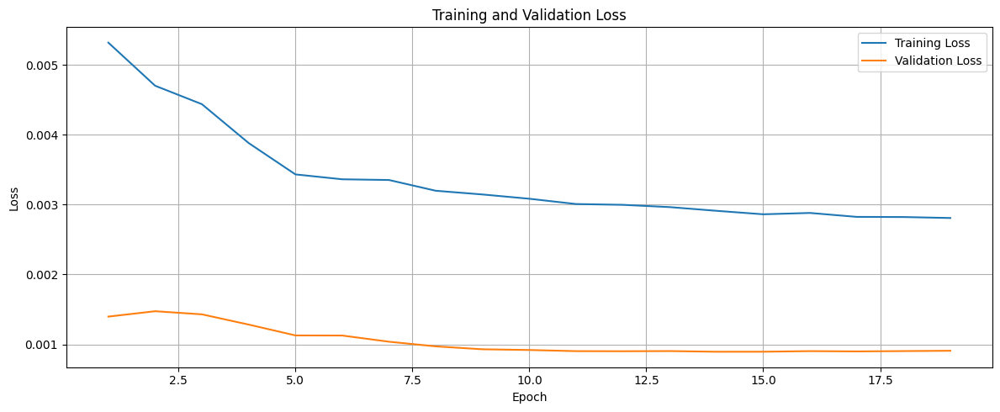

307/307 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
Day = 0
mae: 3.449305493666061
mse: 17.579922479189225
rmse: 4.192841814234019
r2: 0.4484941679841471
mape: 0.19575375365605965
mnbe: -12.837003952380105
r_coeff: [0.95512374]


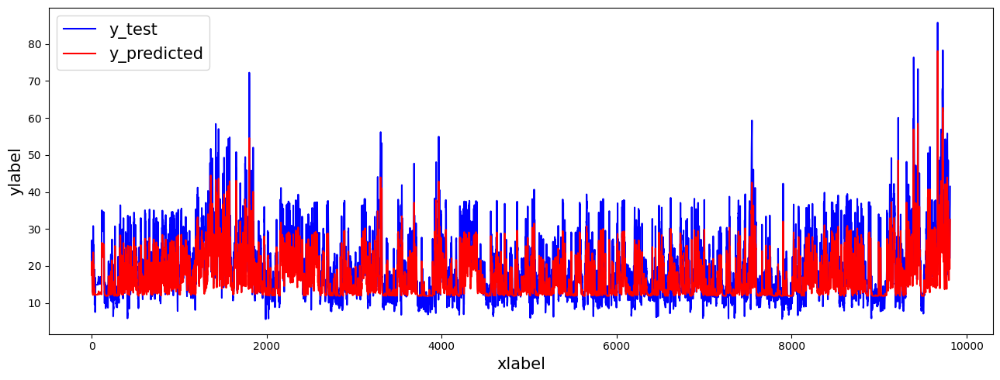

Day = 1
mae: 3.289845340245316
mse: 18.124261013053946
rmse: 4.257259800981607
r2: 0.37172506908161873
mape: 0.18099529986525068
mnbe: -11.471453186699906
r_coeff: [0.95036101]


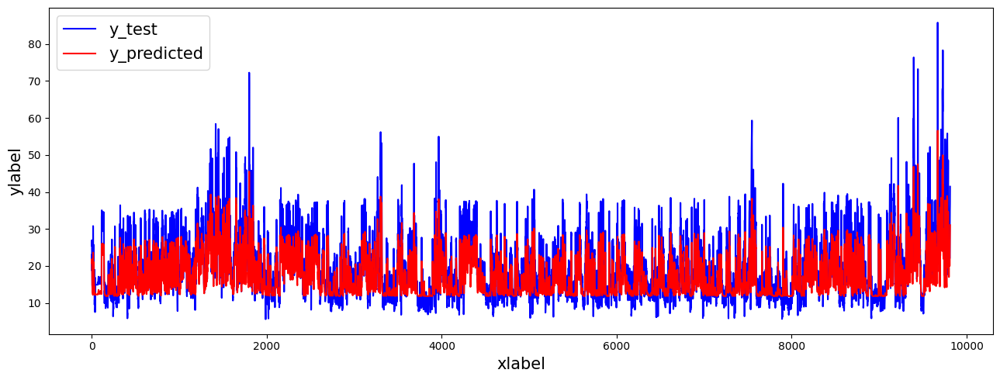

Day = 2
mae: 3.4094917523968027
mse: 20.295719370307253
rmse: 4.505077065967601
r2: 0.2218054770446305
mape: 0.18661058558438445
mnbe: -12.052891545116431
r_coeff: [0.94748183]


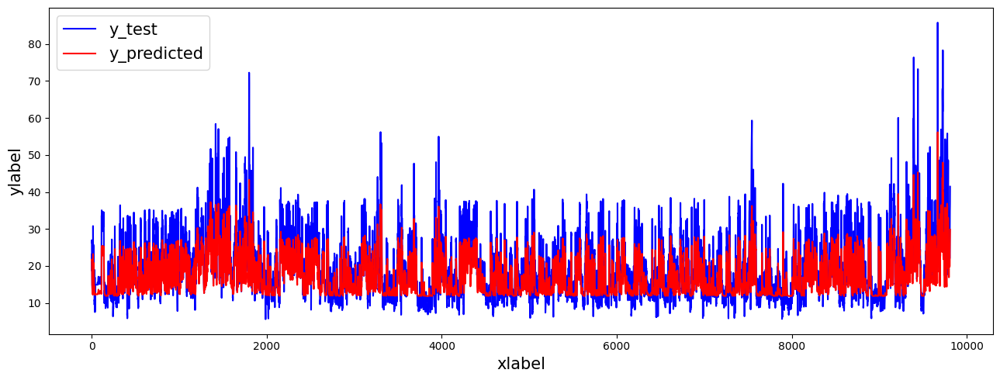

Day = 3
mae: 3.7214444519481296
mse: 24.999671599761783
rmse: 4.999967159868331
r2: -0.1626022662956761
mape: 0.20466869070559277
mnbe: -13.790163716289763
r_coeff: [0.94498886]


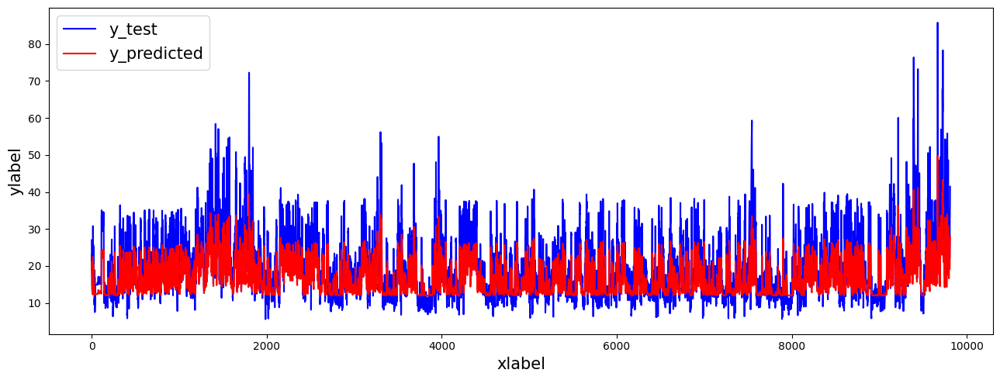

In [12]:
lstms2s = define_lstms2s_model(n_past, n_future, X_train.shape[-1], y_train.shape[-1], "lstms2s_no_shift")

history = lstms2s.fit(X_train, y_train,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred = lstms2s.predict(X_test)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

#### Shifted 1

Model: "lstms2s_shifted_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ (None, 168, 128)  │     67,072 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ [(None, 64),      │     49,408 │ lstm_4[0][0]      │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 32)        │      2,080 │ lstm_5[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_1     │ (None, 4, 32)     │          0 │ dense_2[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_6 (LSTM)       │ (None, 4, 64)     │     24,832 │ repeat_vector_1[… │
│                     │                   │            │ lstm_5[0][1],     │
│                     │                   │            │ lstm_5[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_7 (LSTM)       │ (None, 4, 128)    │     98,816 │ lstm_6[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_1  │ (None, 4, 1)      │        129 │ lstm_7[0][0]      │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 242,337 (946.63 KB)

 Trainable params: 242,337 (946.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 39s 113ms/step - loss: 0.0054 - val_loss: 0.0016
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step - loss: 0.0048 - val_loss: 0.0015
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0046 - val_loss: 0.0016
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0043 - val_loss: 0.0014
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.0041 - val_loss: 0.0013
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0039 - val_loss: 0.0012
Epoch 7/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0037 - val_loss: 0.0011
Epoch 8/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0036 - val_loss: 0.0011
Epoch 9/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0035 - val_loss: 0.0011
Epoch 10/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0035 - val_loss: 0.0011
Epoch 11/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 43ms/step - loss: 0.0034 - val_loss: 0.0010
Epoch 12/200
249/2

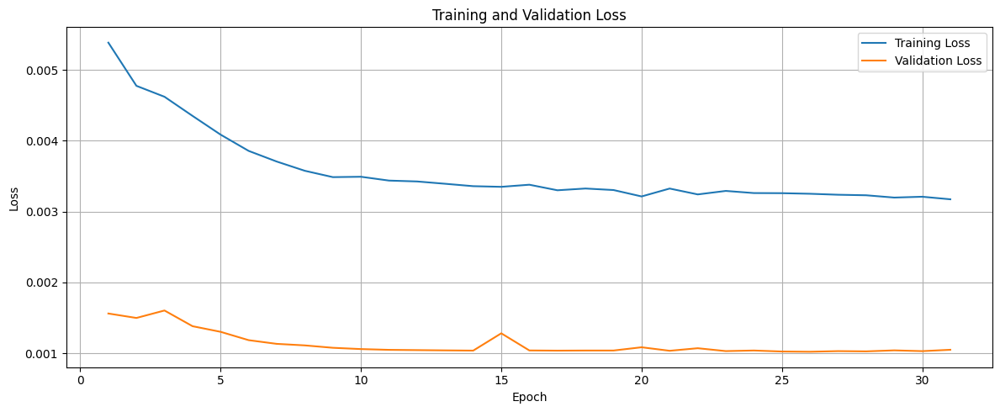

307/307 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step
Day = 0
mae: 4.096437398331643
mse: 32.36193726060553
rmse: 5.688755334922177
r2: -0.2965404575555084
mape: 0.2360997229763588
mnbe: -12.412776262203403
r_coeff: [0.81411279]


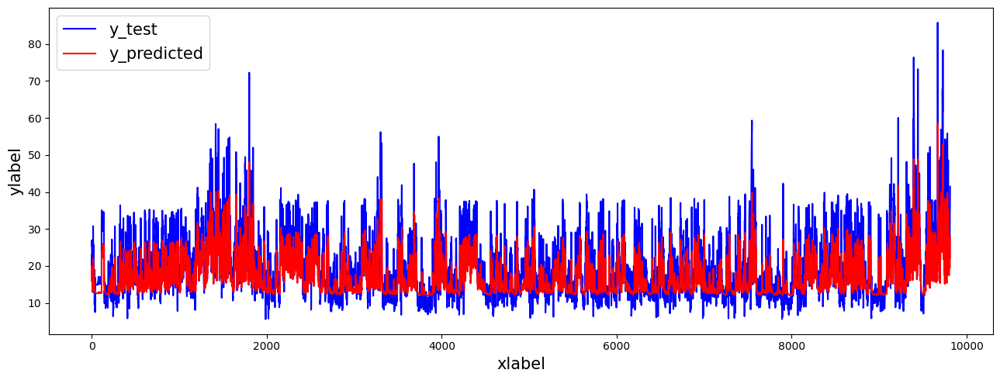

Day = 1
mae: 4.10302232463862
mse: 33.6532335469978
rmse: 5.801140710842808
r2: -0.28965528218335757
mape: 0.24024204442109137
mnbe: -13.559201762682143
r_coeff: [0.80737766]


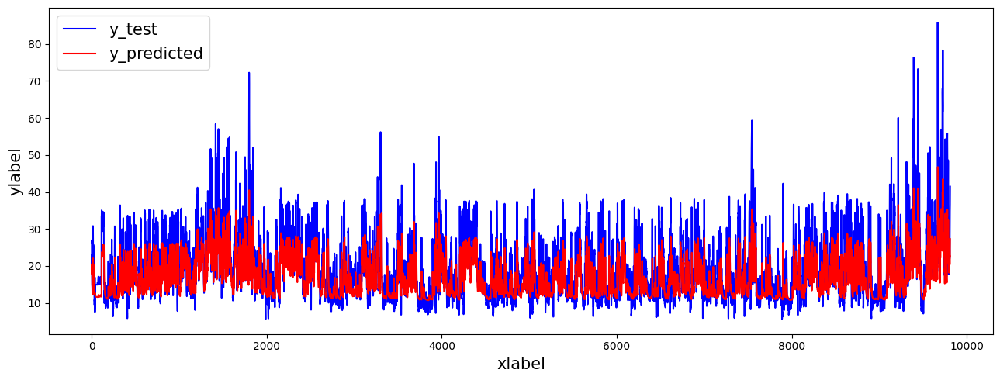

Day = 2
mae: 4.149696119050213
mse: 34.66532446564181
rmse: 5.887726595693945
r2: -0.37763588702127815
mape: 0.24369284425273757
mnbe: -14.054837334558993
r_coeff: [0.80503103]


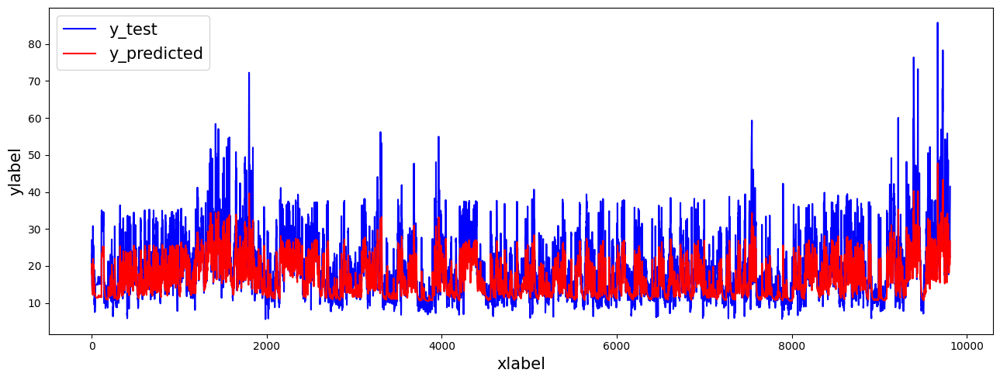

Day = 3
mae: 4.260831057932738
mse: 37.16968399097651
rmse: 6.096694513502912
r2: -0.7750741314553127
mape: 0.24837686307259163
mnbe: -14.73803605230887
r_coeff: [0.80388069]


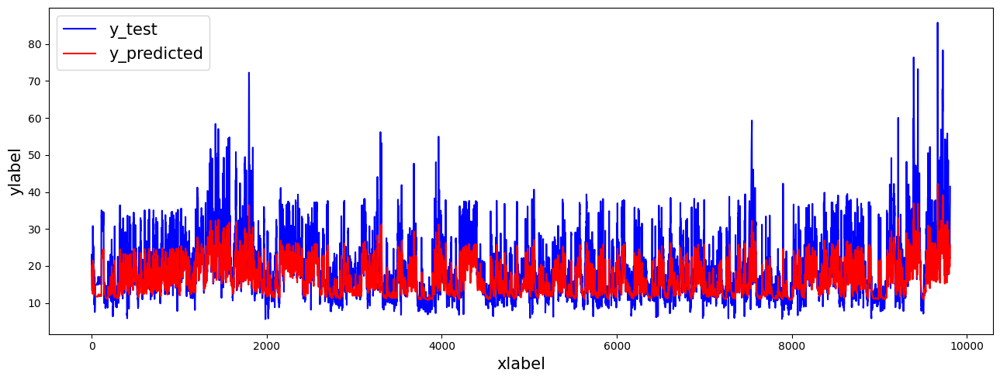

In [13]:
lstms2s_shifted_1 = define_lstms2s_model(n_past, n_future, X_train_shifted_1.shape[-1], y_train_shifted_1.shape[-1], "lstms2s_shifted_1")

history = lstms2s_shifted_1.fit(X_train_shifted_1, y_train_shifted_1,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_shifted_1 = lstms2s_shifted_1.predict(X_test_shifted_1)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test_shifted_1[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred_shifted_1[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

#### Shifted 2

Model: "lstms2s_shifted_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_8 (LSTM)       │ (None, 168, 128)  │     67,072 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_9 (LSTM)       │ [(None, 64),      │     49,408 │ lstm_8[0][0]      │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 32)        │      2,080 │ lstm_9[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_2     │ (None, 4, 32)     │          0 │ dense_4[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_10 (LSTM)      │ (None, 4, 64)     │     24,832 │ repeat_vector_2[… │
│                     │                   │            │ lstm_9[0][1],     │
│                     │                   │            │ lstm_9[0][2]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_11 (LSTM)      │ (None, 4, 128)    │     98,816 │ lstm_10[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_2  │ (None, 4, 1)      │        129 │ lstm_11[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 242,337 (946.63 KB)

 Trainable params: 242,337 (946.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 30s 78ms/step - loss: 0.0053 - val_loss: 0.0015
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0049 - val_loss: 0.0016
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0048 - val_loss: 0.0018
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 48ms/step - loss: 0.0045 - val_loss: 0.0022
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0046 - val_loss: 0.0017
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0043 - val_loss: 0.0016
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.


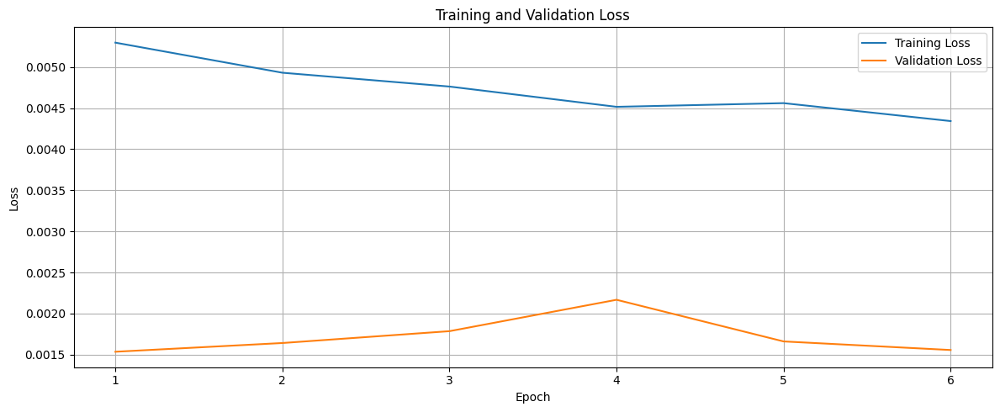

307/307 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step
Day = 0
mae: 6.675629225270943
mse: 92.8753141831929
rmse: 9.63718393428251
r2: -1657.8108895930611
mape: 0.46586618578739447
mnbe: -26.23753440069219
r_coeff: [0.56830438]


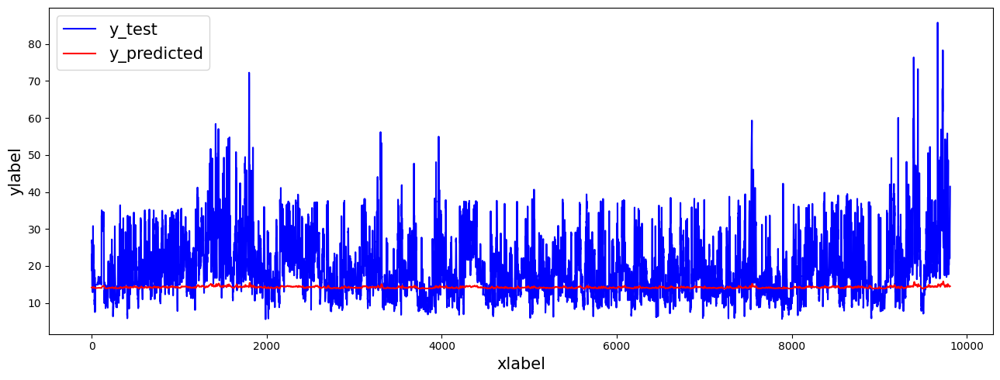

Day = 1
mae: 7.027715196089658
mse: 101.39030777305253
rmse: 10.069275434362321
r2: -3435.6882179989952
mape: 0.5178457371114562
mnbe: -30.02887500661
r_coeff: [0.56681204]


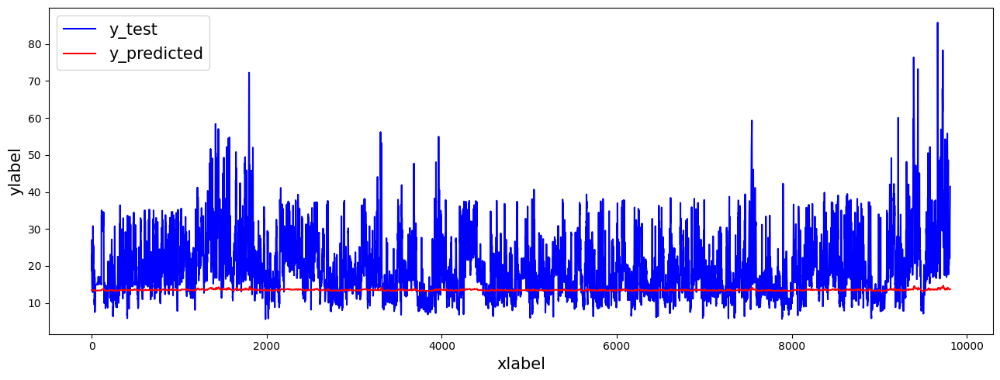

Day = 2
mae: 7.5262613634895015
mse: 113.05068156125775
rmse: 10.632529405614534
r2: -8722.219088110178
mape: 0.5949606344201954
mnbe: -34.66138570882949
r_coeff: [0.56561292]


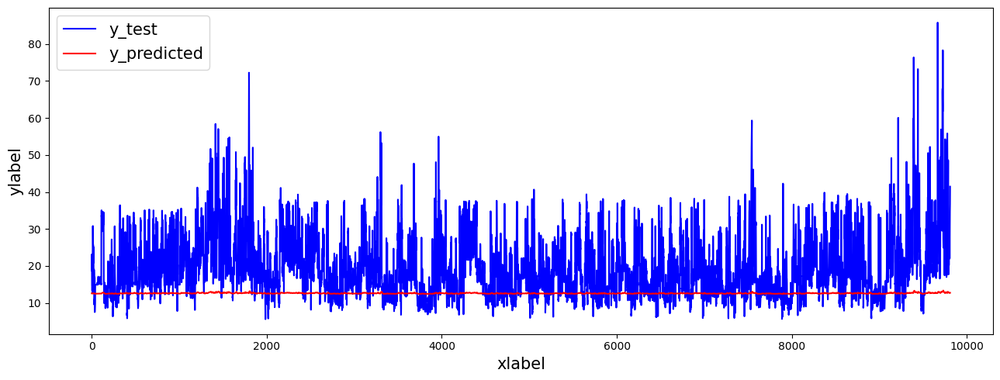

Day = 3
mae: 7.989445788844797
mse: 123.54142951881268
rmse: 11.114919231322046
r2: -27507.608295259997
mape: 0.6707080386342087
mnbe: -38.365807291905405
r_coeff: [0.56198762]


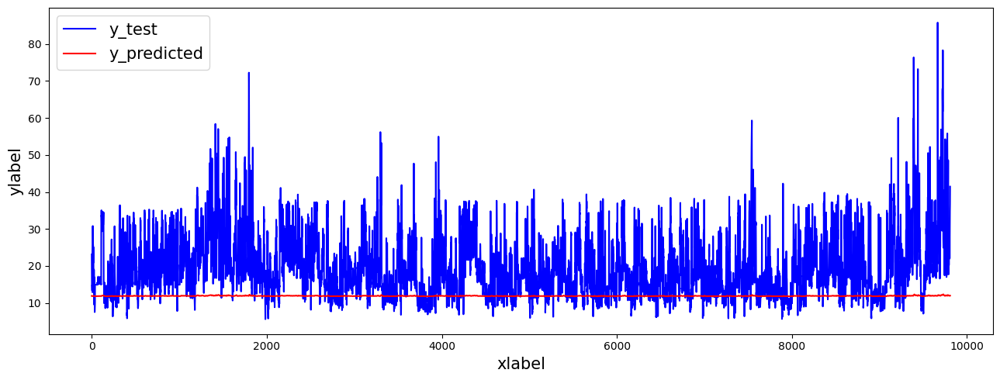

In [14]:
lstms2s_shifted_2 = define_lstms2s_model(n_past, n_future, X_train_shifted_2.shape[-1], y_train_shifted_2.shape[-1], "lstms2s_shifted_2")

history = lstms2s_shifted_2.fit(X_train_shifted_2, y_train_shifted_2,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_shifted_2 = lstms2s_shifted_2.predict(X_test_shifted_2)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test_shifted_2[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred_shifted_2[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

#### Shifted 3

Model: "lstms2s_shifted_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_12 (LSTM)      │ (None, 168, 128)  │     67,072 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_13 (LSTM)      │ [(None, 64),      │     49,408 │ lstm_12[0][0]     │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 32)        │      2,080 │ lstm_13[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_3     │ (None, 4, 32)     │          0 │ dense_6[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_14 (LSTM)      │ (None, 4, 64)     │     24,832 │ repeat_vector_3[… │
│                     │                   │            │ lstm_13[0][1],    │
│                     │                   │            │ lstm_13[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_15 (LSTM)      │ (None, 4, 128)    │     98,816 │ lstm_14[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_3  │ (None, 4, 1)      │        129 │ lstm_15[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 242,337 (946.63 KB)

 Trainable params: 242,337 (946.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 40s 117ms/step - loss: 0.0054 - val_loss: 0.0014
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0049 - val_loss: 0.0016
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 42ms/step - loss: 0.0048 - val_loss: 0.0016
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0047 - val_loss: 0.0018
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.0045 - val_loss: 0.0018
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0044 - val_loss: 0.0018
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.


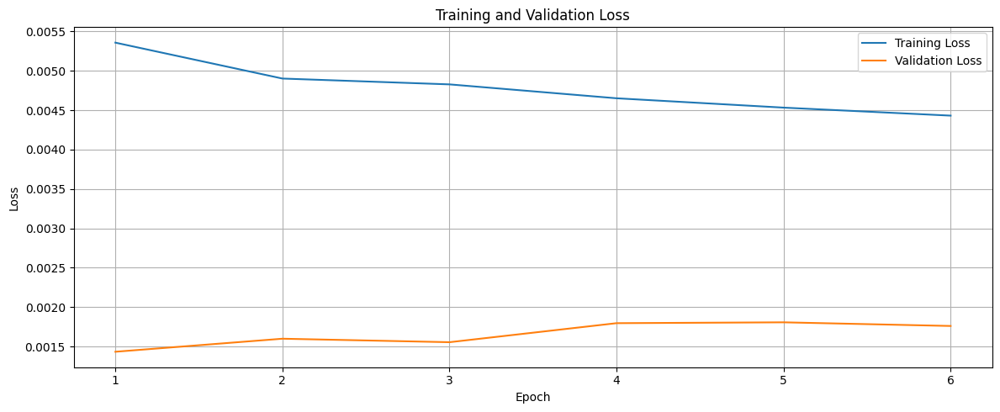

307/307 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
Day = 0
mae: 6.443118209038495
mse: 87.0196885276995
rmse: 9.328434409251077
r2: -1117.1813891775803
mape: 0.4316115006881159
mnbe: -23.131955023654577
r_coeff: [0.52141349]


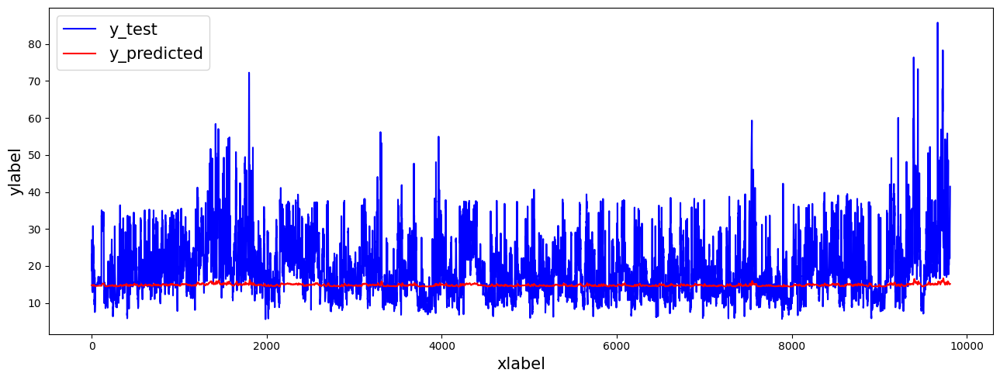

Day = 1
mae: 6.457655753910744
mse: 87.22168800966354
rmse: 9.33925521707505
r2: -2737.285549393694
mape: 0.4316751461583823
mnbe: -22.763018029005288
r_coeff: [0.5201628]


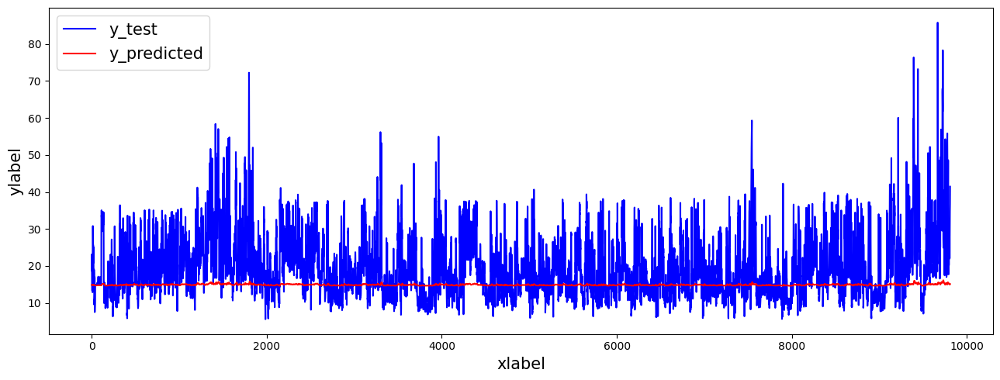

Day = 2
mae: 6.655525732451771
mse: 92.31043372083748
rmse: 9.607831894909355
r2: -10317.59233398837
mape: 0.46045827801258177
mnbe: -25.21598917194113
r_coeff: [0.51613539]


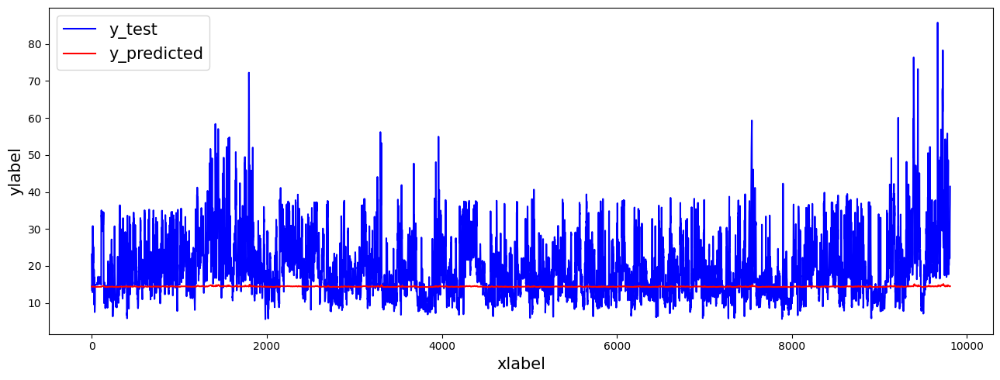

Day = 3
mae: 6.842244225698566
mse: 96.98848054955924
rmse: 9.848272972940952
r2: -80584.800288485
mape: 0.4881326600444805
mnbe: -27.34358120014087
r_coeff: [0.49339281]


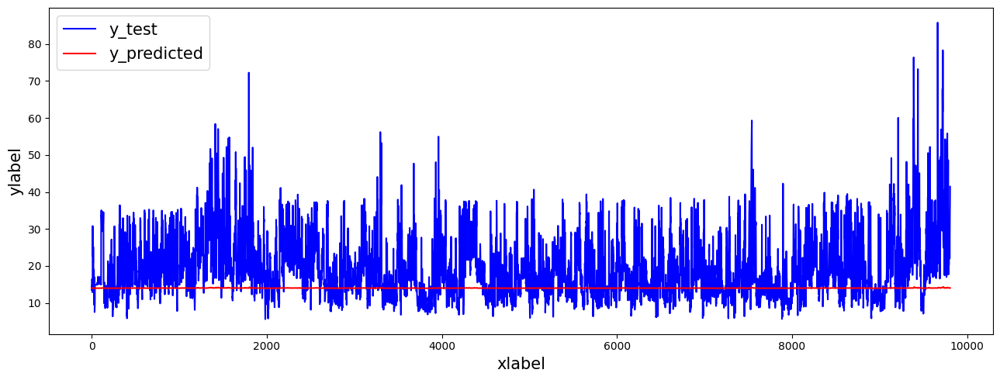

In [15]:
lstms2s_shifted_3 = define_lstms2s_model(n_past, n_future, X_train_shifted_3.shape[-1], y_train_shifted_3.shape[-1], "lstms2s_shifted_3")

history = lstms2s_shifted_3.fit(X_train_shifted_3, y_train_shifted_3,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_shifted_3 = lstms2s_shifted_3.predict(X_test_shifted_3)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test_shifted_3[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred_shifted_3[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

#### Shifted 4

Model: "lstms2s_shifted_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_16 (LSTM)      │ (None, 168, 128)  │     67,072 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_17 (LSTM)      │ [(None, 64),      │     49,408 │ lstm_16[0][0]     │
│                     │ (None, 64),       │            │                   │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 32)        │      2,080 │ lstm_17[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_4     │ (None, 4, 32)     │          0 │ dense_8[0][0]     │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_18 (LSTM)      │ (None, 4, 64)     │     24,832 │ repeat_vector_4[… │
│                     │                   │            │ lstm_17[0][1],    │
│                     │                   │            │ lstm_17[0][2]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_19 (LSTM)      │ (None, 4, 128)    │     98,816 │ lstm_18[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_4  │ (None, 4, 1)      │        129 │ lstm_19[0][0]     │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 242,337 (946.63 KB)

 Trainable params: 242,337 (946.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 40s 116ms/step - loss: 0.0054 - val_loss: 0.0016
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 41ms/step - loss: 0.0049 - val_loss: 0.0016
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0048 - val_loss: 0.0018
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0047 - val_loss: 0.0018
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0046 - val_loss: 0.0019
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.0045 - val_loss: 0.0019
Epoch 6: early stopping
Restoring model weights from the end of the best epoch: 1.


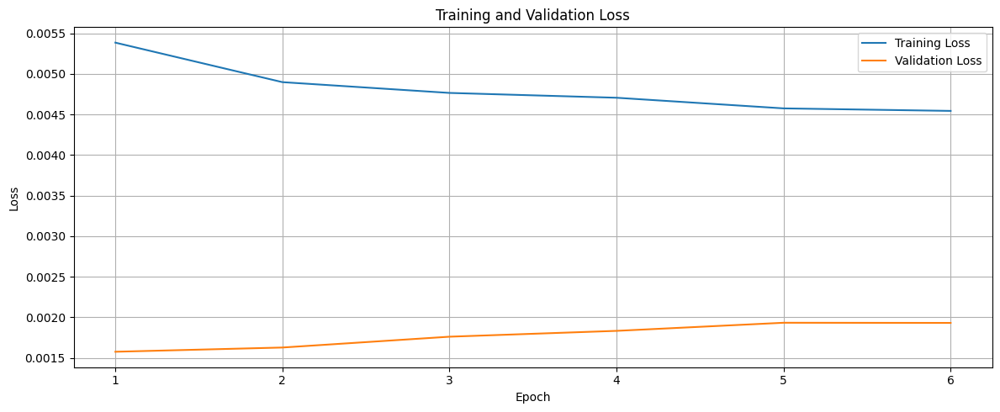

307/307 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step
Day = 0
mae: 6.619616213331326
mse: 91.52223636652532
rmse: 9.566725477744479
r2: -3156.4268613918944
mape: 0.4563685364871406
mnbe: -25.078024604614797
r_coeff: [0.47817043]


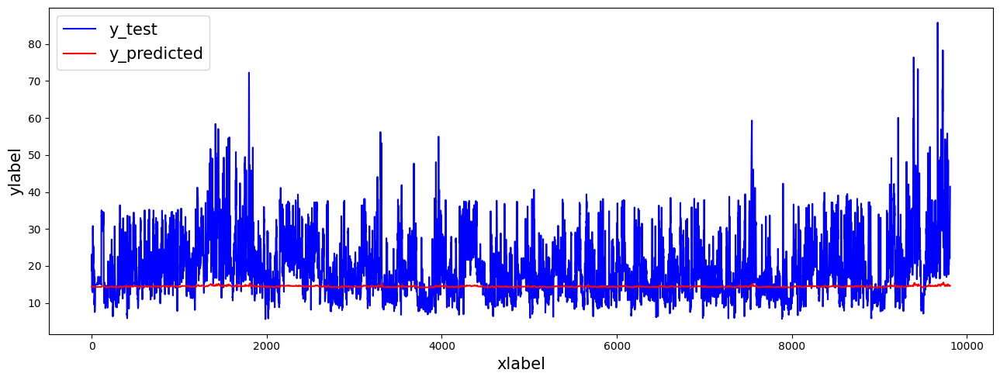

Day = 1
mae: 7.030400655075864
mse: 101.60042771646293
rmse: 10.079703751423597
r2: -10270.067163278498
mape: 0.5177427179063876
mnbe: -29.75455652982942
r_coeff: [0.47639618]


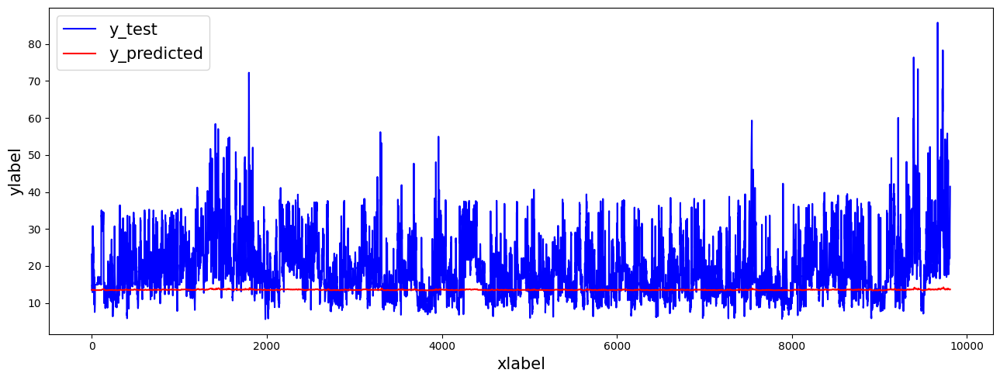

Day = 2
mae: 7.703709817512345
mse: 117.3208467393303
rmse: 10.831474818293689
r2: -79381.09254721264
mape: 0.623739853307939
mnbe: -35.995269412109025
r_coeff: [0.47245101]


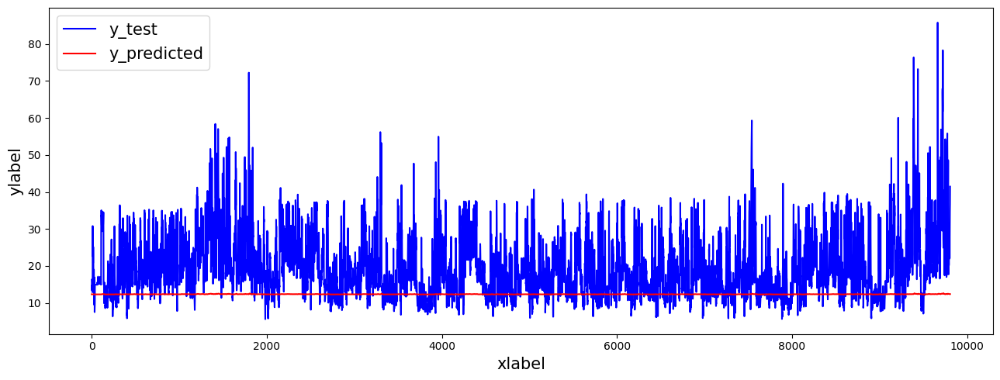

Day = 3
mae: 8.374313888165753
mse: 132.23644865692492
rmse: 11.499410796076681
r2: -6775179.863094159
mape: 0.7377417402816976
mnbe: -41.089484374503144
r_coeff: [-0.32091869]


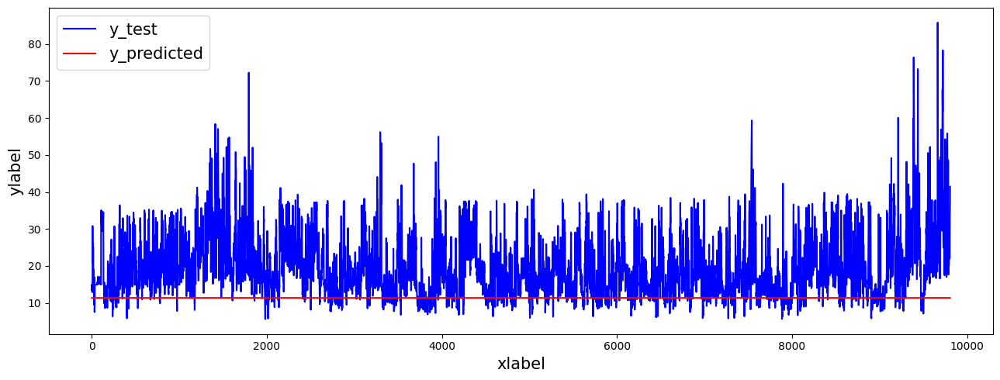

In [16]:
lstms2s_shifted_4 = define_lstms2s_model(n_past, n_future, X_train_shifted_4.shape[-1], y_train_shifted_4.shape[-1], "lstms2s_shifted_4")

history = lstms2s_shifted_4.fit(X_train_shifted_4, y_train_shifted_4,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_shifted_4 = lstms2s_shifted_4.predict(X_test_shifted_4)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test_shifted_4[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred_shifted_4[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

### GRU-Seq2Seq

In [17]:
def define_grus2s_model(n_past, n_future, n_features, n_label, name="model"):
    # encoder layers
    encoder_inputs = Input(shape=(n_past, n_features))
    encoder_gru_1 = GRU(128, return_sequences=True, activation="relu")(encoder_inputs)
    encoder_gru_2, state_h = GRU(64, return_state=True, activation="relu")(encoder_gru_1)
    encoder_dropout = Dropout(0.2)(encoder_gru_2)
    encoder_dense = Dense(latent_dim)(encoder_dropout)
    # Repeat layer
    decoder_repeat_vector = RepeatVector(n_future)(encoder_dense)
    # Decoder layers
    decoder_gru_1 = GRU(64, return_sequences=True, activation="relu")(decoder_repeat_vector, initial_state=state_h)
    decoder_gru_2 = GRU(128, return_sequences=True, activation="relu")(decoder_gru_1)
    decoder_dropout = Dropout(0.2)(decoder_gru_2)
    decoder_outputs = TimeDistributed(Dense(n_label))(decoder_dropout)
    # Compile the model
    model = Model(encoder_inputs, decoder_outputs)
    model.name = name
    model.compile(optimizer=Adam(learning_rate=0.001), loss=MeanSquaredError())
    display(model.summary())
    return model

#### No shift

Model: "grus2s_no_shift"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru (GRU)           │ (None, 168, 128)  │     50,688 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_1 (GRU)         │ [(None, 64),      │     37,248 │ gru[0][0]         │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 64)        │          0 │ gru_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 32)        │      2,080 │ dropout[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_5     │ (None, 4, 32)     │          0 │ dense_10[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_2 (GRU)         │ (None, 4, 64)     │     18,816 │ repeat_vector_5[… │
│                     │                   │            │ gru_1[0][1]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_3 (GRU)         │ (None, 4, 128)    │     74,496 │ gru_2[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 4, 128)    │          0 │ gru_3[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_5  │ (None, 4, 1)      │        129 │ dropout_1[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 183,457 (716.63 KB)

 Trainable params: 183,457 (716.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 43s 99ms/step - loss: 0.0050 - val_loss: 0.0016
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0038 - val_loss: 0.0015
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0033 - val_loss: 0.0011
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 54ms/step - loss: 0.0031 - val_loss: 0.0011
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0031 - val_loss: 9.6189e-04
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0030 - val_loss: 0.0011
Epoch 7/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0030 - val_loss: 0.0010
Epoch 8/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 44ms/step - loss: 0.0030 - val_loss: 0.0010
Epoch 9/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0030 - val_loss: 0.0010
Epoch 10/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0029 - val_loss: 0.0010
Epoch 10: early stopping
Restoring model weights from the end of the best epoch: 5.


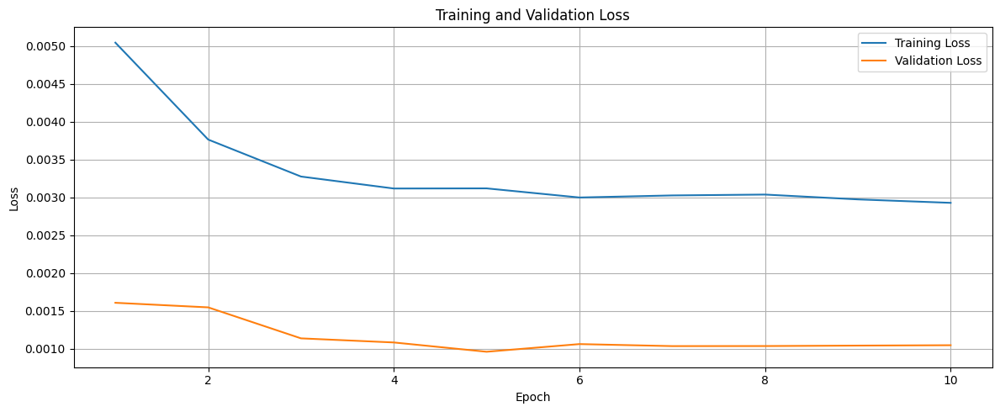

307/307 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
Day = 0
mae: 3.2149370818355987
mse: 14.39776888986444
rmse: 3.794439206241739
r2: 0.5993338589686638
mape: 0.18570558067357218
mnbe: -12.38287677632052
r_coeff: [0.96776758]


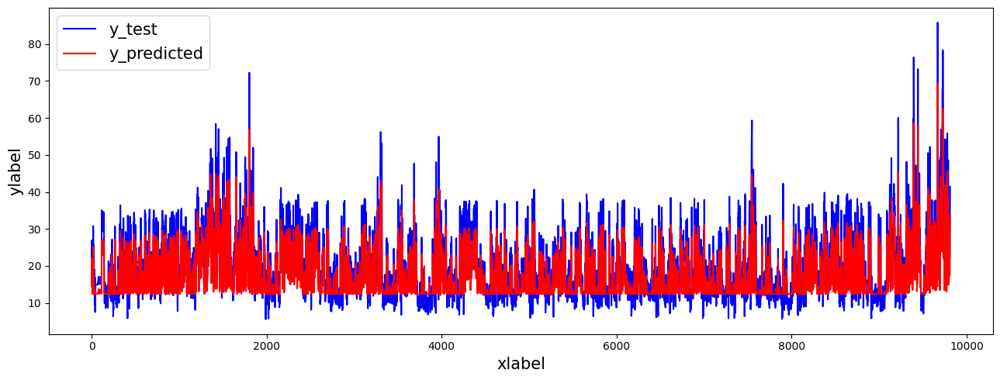

Day = 1
mae: 3.8702332169283995
mse: 22.676613269615952
rmse: 4.761996773373115
r2: 0.14876323547487558
mape: 0.22424937697454458
mnbe: -15.94116647637749
r_coeff: [0.9632894]


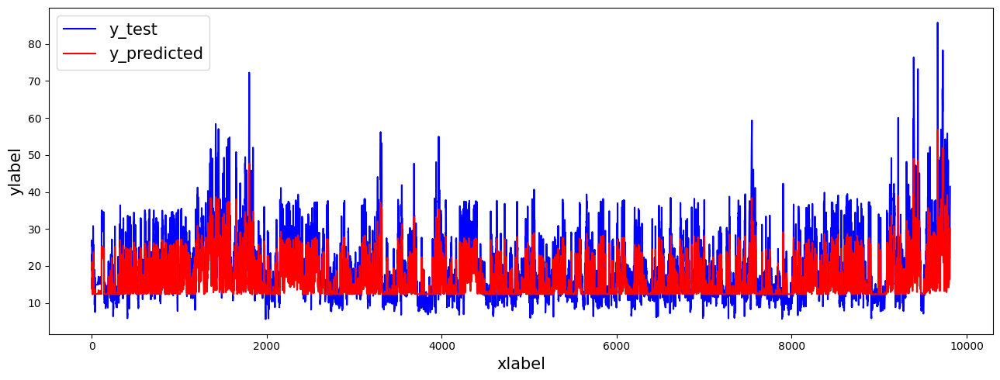

Day = 2
mae: 4.660969528352029
mse: 34.614224312309474
rmse: 5.883385446518822
r2: -0.8185178545727698
mape: 0.27957636103755756
mnbe: -20.55303784699961
r_coeff: [0.95687783]


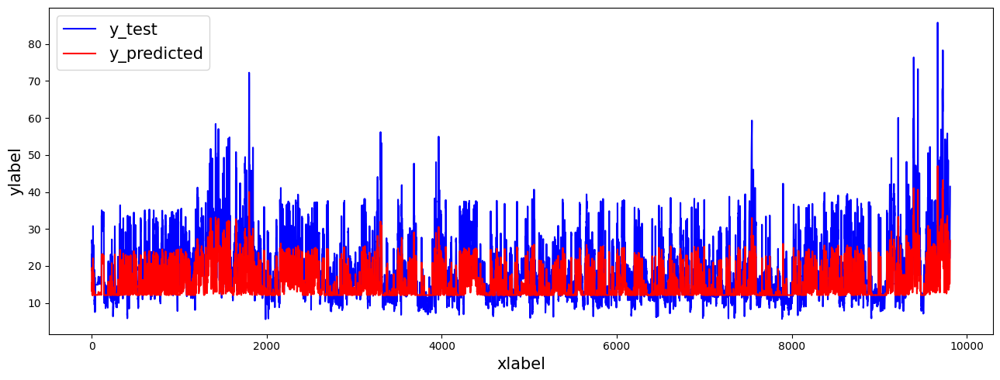

Day = 3
mae: 5.254385197381383
mse: 45.429842419083364
rmse: 6.740166349511217
r2: -2.2122801645110717
mape: 0.3267188377206745
mnbe: -23.961893490001344
r_coeff: [0.94946119]


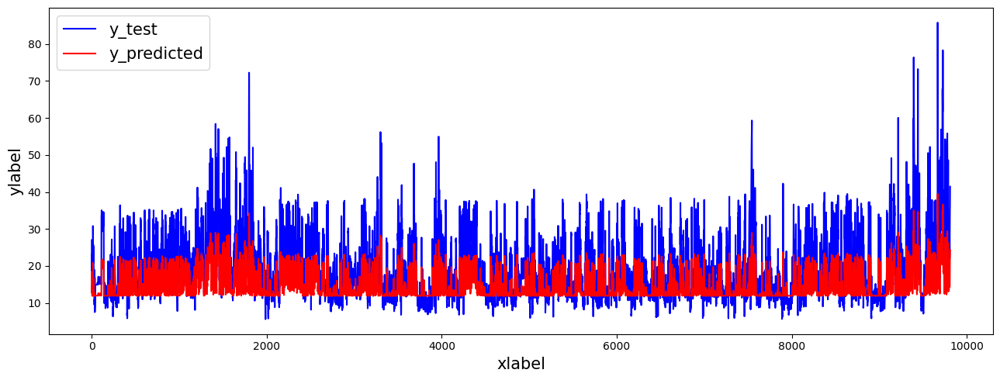

In [18]:
grus2s = define_grus2s_model(n_past, n_future, X_train.shape[-1], y_train.shape[-1], "grus2s_no_shift")

history = grus2s.fit(X_train, y_train,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred = grus2s.predict(X_test)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

#### Shifted 1

Model: "grus2s_shifted_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_4 (GRU)         │ (None, 168, 128)  │     50,688 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_5 (GRU)         │ [(None, 64),      │     37,248 │ gru_4[0][0]       │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 64)        │          0 │ gru_5[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_12 (Dense)    │ (None, 32)        │      2,080 │ dropout_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_6     │ (None, 4, 32)     │          0 │ dense_12[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_6 (GRU)         │ (None, 4, 64)     │     18,816 │ repeat_vector_6[… │
│                     │                   │            │ gru_5[0][1]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_7 (GRU)         │ (None, 4, 128)    │     74,496 │ gru_6[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 4, 128)    │          0 │ gru_7[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_6  │ (None, 4, 1)      │        129 │ dropout_3[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 183,457 (716.63 KB)

 Trainable params: 183,457 (716.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 35s 97ms/step - loss: 0.0051 - val_loss: 0.0016
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step - loss: 0.0045 - val_loss: 0.0014
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0040 - val_loss: 0.0014
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0038 - val_loss: 0.0012
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0038 - val_loss: 0.0012
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0037 - val_loss: 0.0011
Epoch 7/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0036 - val_loss: 0.0011
Epoch 8/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0035 - val_loss: 0.0011
Epoch 9/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0035 - val_loss: 0.0011
Epoch 10/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 53ms/step - loss: 0.0034 - val_loss: 0.0012
Epoch 11/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step - loss: 0.0034 - val_loss: 0.0011
Epoch 12/200
249/24

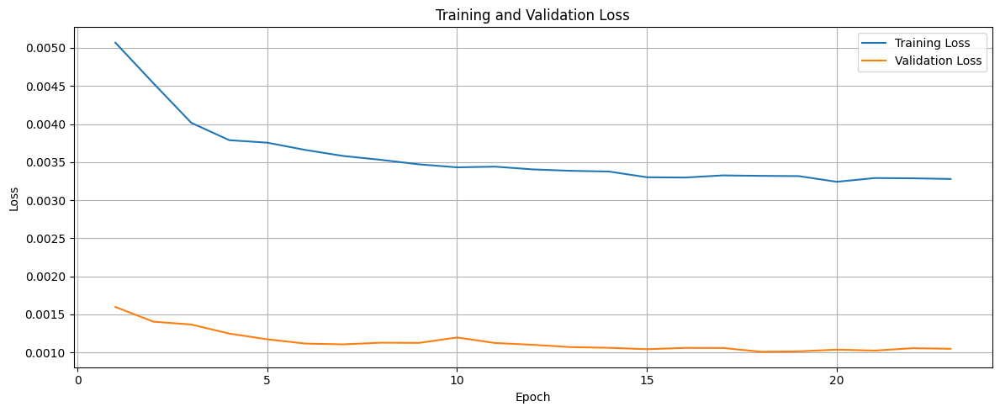

307/307 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
Day = 0
mae: 4.132698055858064
mse: 32.49915514332668
rmse: 5.700803026182073
r2: -0.017349473388190928
mape: 0.25174199477336684
mnbe: -16.180184351415395
r_coeff: [0.83475811]


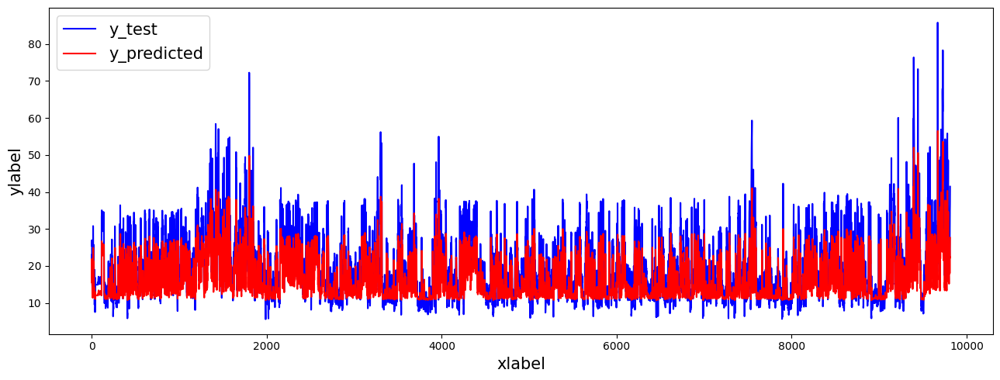

Day = 1
mae: 4.1032620427587005
mse: 32.97766670745215
rmse: 5.742618453933027
r2: -0.08610232176763177
mape: 0.24840679617281874
mnbe: -16.025648350190995
r_coeff: [0.83179499]


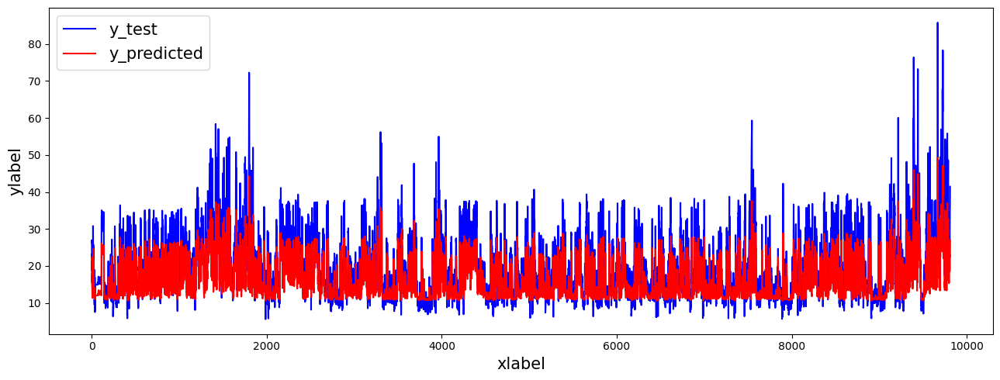

Day = 2
mae: 3.968494614969977
mse: 32.68236834406768
rmse: 5.716849512106094
r2: -0.29693806777335974
mape: 0.22990885909021982
mnbe: -14.11288877931915
r_coeff: [0.82930112]


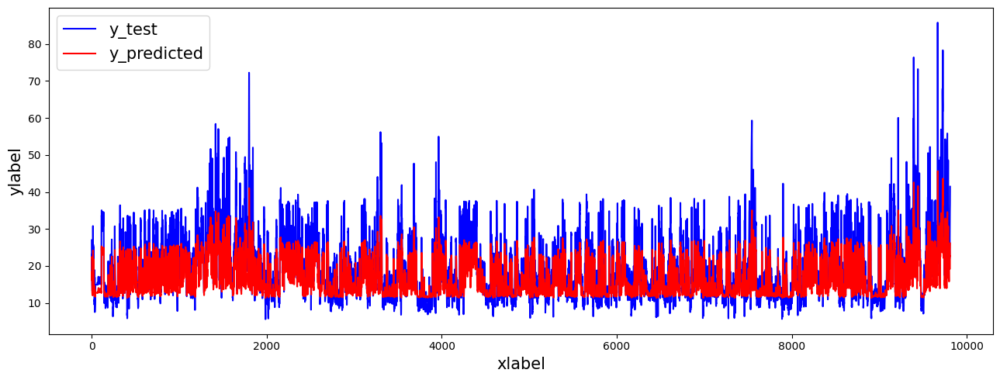

Day = 3
mae: 3.9378215508721337
mse: 33.721811546341364
rmse: 5.8070484367139015
r2: -0.7115326199645955
mape: 0.2204526714843369
mnbe: -12.330941727752592
r_coeff: [0.82591039]


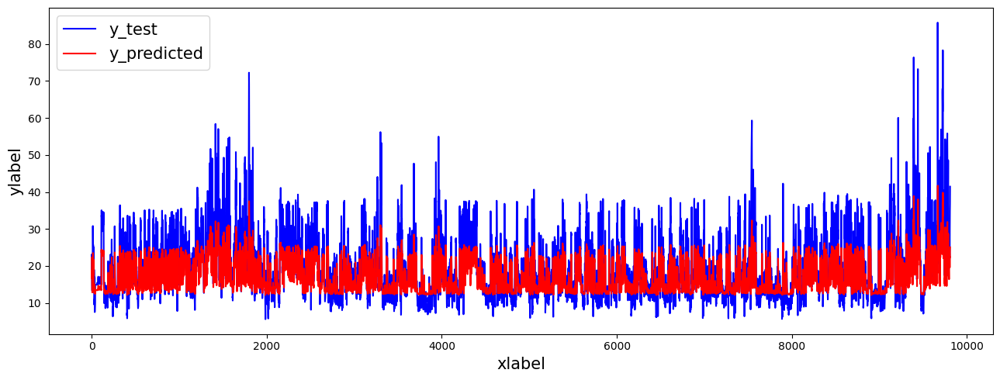

In [19]:
grus2s_shifted_1 = define_grus2s_model(n_past, n_future, X_train_shifted_1.shape[-1], y_train.shape[-1], "grus2s_shifted_1")

history = grus2s_shifted_1.fit(X_train_shifted_1, y_train_shifted_1,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_shifted_1 = grus2s_shifted_1.predict(X_test_shifted_1)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test_shifted_1[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred_shifted_1[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

#### Shifted 2

Model: "grus2s_shifted_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_8 (GRU)         │ (None, 168, 128)  │     50,688 │ input_layer_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_9 (GRU)         │ [(None, 64),      │     37,248 │ gru_8[0][0]       │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_4 (Dropout) │ (None, 64)        │          0 │ gru_9[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_14 (Dense)    │ (None, 32)        │      2,080 │ dropout_4[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_7     │ (None, 4, 32)     │          0 │ dense_14[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_10 (GRU)        │ (None, 4, 64)     │     18,816 │ repeat_vector_7[… │
│                     │                   │            │ gru_9[0][1]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_11 (GRU)        │ (None, 4, 128)    │     74,496 │ gru_10[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 4, 128)    │          0 │ gru_11[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_7  │ (None, 4, 1)      │        129 │ dropout_5[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 183,457 (716.63 KB)

 Trainable params: 183,457 (716.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 31s 82ms/step - loss: 0.0051 - val_loss: 0.0017
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0047 - val_loss: 0.0018
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 14s 55ms/step - loss: 0.0046 - val_loss: 0.0019
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 12s 46ms/step - loss: 0.0043 - val_loss: 0.0013
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step - loss: 0.0041 - val_loss: 0.0013
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 46ms/step - loss: 0.0040 - val_loss: 0.0012
Epoch 7/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0039 - val_loss: 0.0012
Epoch 8/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0039 - val_loss: 0.0012
Epoch 9/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 10/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 11/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.0038 - val_loss: 0.0013
Epoch 12/200
249/24

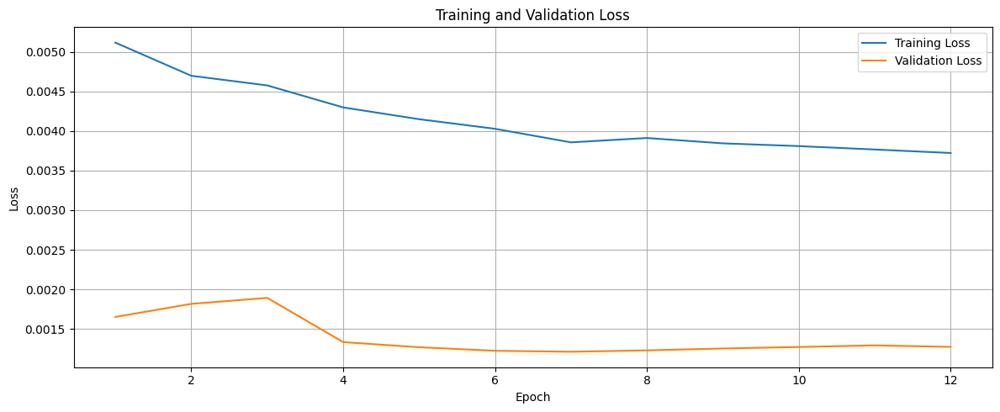

307/307 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
Day = 0
mae: 5.281380787856783
mse: 55.2574134068413
rmse: 7.433533036641547
r2: -2.6219355860209
mape: 0.3347581105251431
mnbe: -19.65289417119337
r_coeff: [0.67315707]


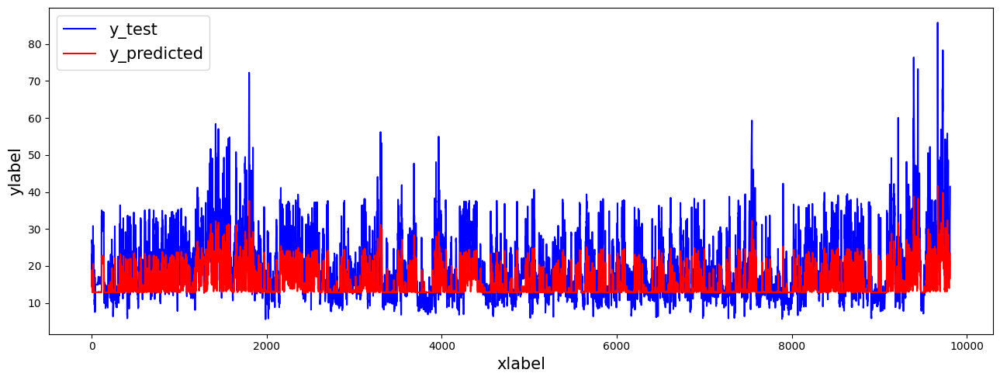

Day = 1
mae: 5.226066754426675
mse: 54.79682817001408
rmse: 7.402487971622384
r2: -3.2812410152927898
mape: 0.32406050970849376
mnbe: -18.519096462506702
r_coeff: [0.67451979]


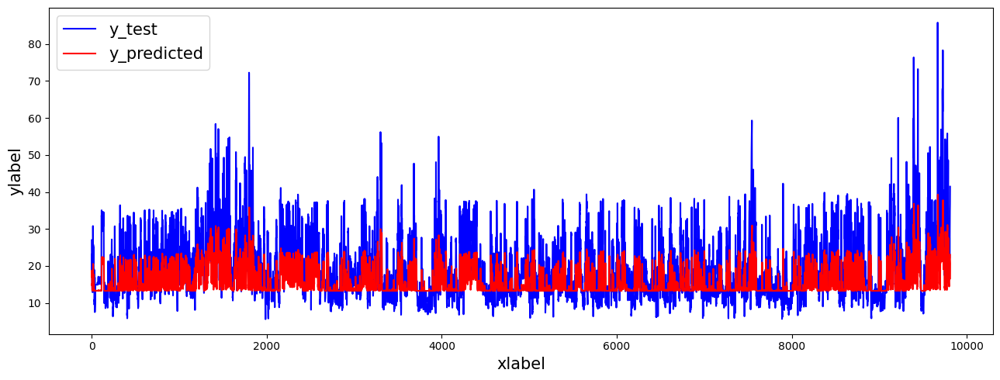

Day = 2
mae: 5.261395661794107
mse: 56.010859070939716
rmse: 7.484040290574318
r2: -5.102695663084725
mape: 0.3196006464904001
mnbe: -17.350542646295487
r_coeff: [0.66999827]


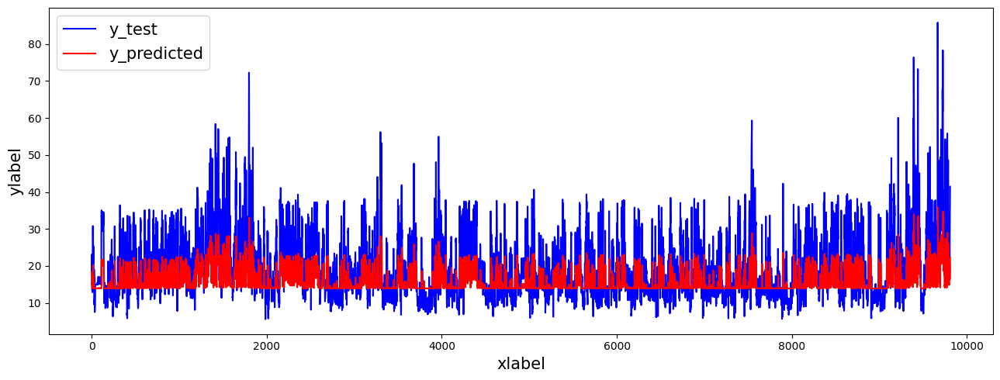

Day = 3
mae: 5.343769741021693
mse: 57.78533494902569
rmse: 7.60166659023044
r2: -7.770803246241334
mape: 0.3206503809200477
mnbe: -16.47649511944777
r_coeff: [0.66328615]


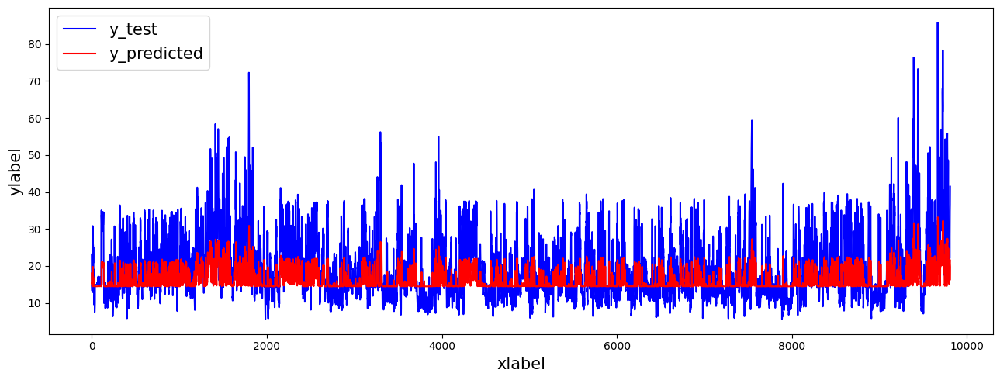

In [20]:
grus2s_shifted_2 = define_grus2s_model(n_past, n_future, X_train_shifted_2.shape[-1], y_train.shape[-1], "grus2s_shifted_2")

history = grus2s_shifted_2.fit(X_train_shifted_2, y_train_shifted_2,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_shifted_2 = grus2s_shifted_2.predict(X_test_shifted_2)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test_shifted_2[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred_shifted_2[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

#### Shifted 3

Model: "grus2s_shifted_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_12 (GRU)        │ (None, 168, 128)  │     50,688 │ input_layer_8[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_13 (GRU)        │ [(None, 64),      │     37,248 │ gru_12[0][0]      │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 64)        │          0 │ gru_13[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_16 (Dense)    │ (None, 32)        │      2,080 │ dropout_6[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_8     │ (None, 4, 32)     │          0 │ dense_16[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_14 (GRU)        │ (None, 4, 64)     │     18,816 │ repeat_vector_8[… │
│                     │                   │            │ gru_13[0][1]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_15 (GRU)        │ (None, 4, 128)    │     74,496 │ gru_14[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 4, 128)    │          0 │ gru_15[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_8  │ (None, 4, 1)      │        129 │ dropout_7[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 183,457 (716.63 KB)

 Trainable params: 183,457 (716.63 KB)

 Non-trainable params: 0 (0.00 B)

None

0epoch [00:00, ?epoch/s]

0batch [00:00, ?batch/s]

Epoch 1/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 35s 98ms/step - loss: 0.0051 - val_loss: 0.0018
Epoch 2/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0050 - val_loss: 0.0016
Epoch 3/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0047 - val_loss: 0.0014
Epoch 4/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0047 - val_loss: 0.0015
Epoch 5/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0044 - val_loss: 0.0015
Epoch 6/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0044 - val_loss: 0.0014
Epoch 7/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step - loss: 0.0043 - val_loss: 0.0014
Epoch 8/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0041 - val_loss: 0.0014
Epoch 9/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0040 - val_loss: 0.0014
Epoch 10/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0040 - val_loss: 0.0015
Epoch 11/200
249/249 ━━━━━━━━━━━━━━━━━━━━ 11s 45ms/step - loss: 0.0040 - val_loss: 0.0015
Epoch 11: early sto

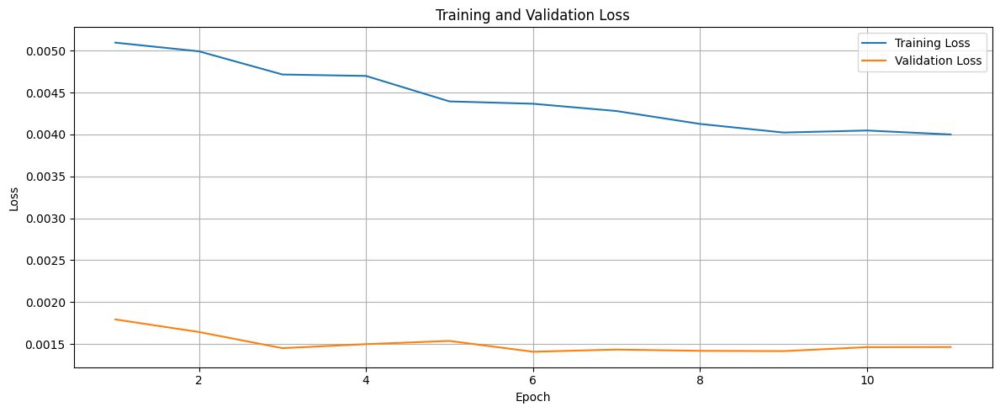

307/307 ━━━━━━━━━━━━━━━━━━━━ 7s 19ms/step
Day = 0
mae: 6.049993892041134
mse: 74.53132205385302
rmse: 8.633152498007494
r2: -15.228813910067771
mape: 0.3995155043205854
mnbe: -23.342854290042865
r_coeff: [0.55394257]


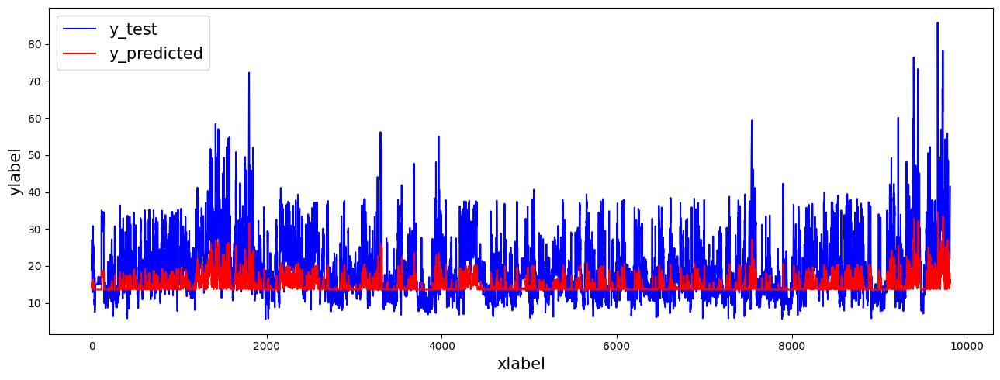

Day = 1
mae: 6.536513607874734
mse: 85.72329388001569
rmse: 9.258687481496267
r2: -25.972083858714605
mape: 0.4595388506744886
mnbe: -28.179190994475523
r_coeff: [0.55306171]


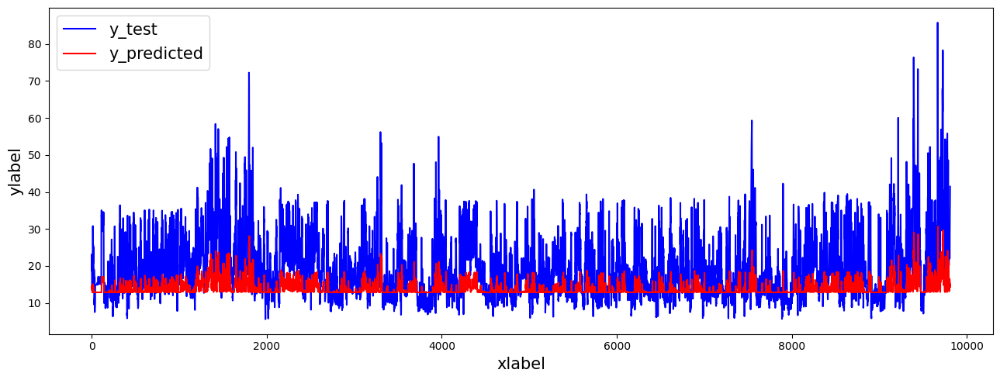

Day = 2
mae: 6.8714879016821975
mse: 94.16002913487755
rmse: 9.703609077805925
r2: -56.66596121229182
mape: 0.4999988910411947
mnbe: -30.63667934443732
r_coeff: [0.55532233]


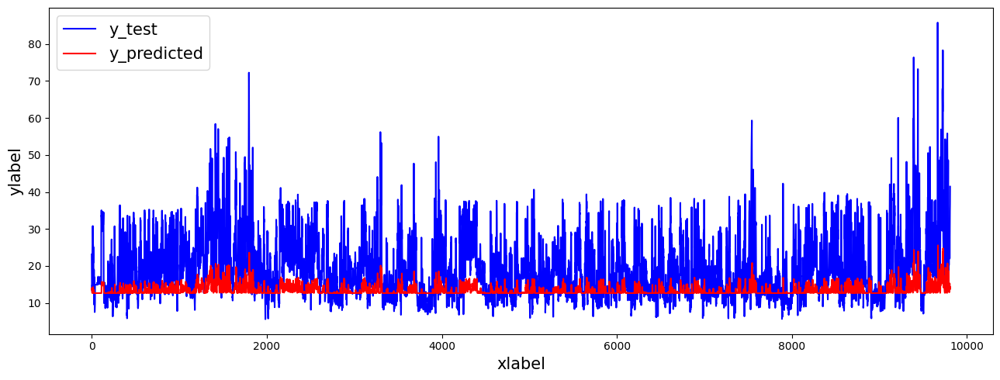

Day = 3
mae: 7.04584500748034
mse: 99.21572283355492
rmse: 9.9607089523565
r2: -133.58292690244963
mape: 0.5214664653212003
mnbe: -31.54298676178897
r_coeff: [0.55719858]


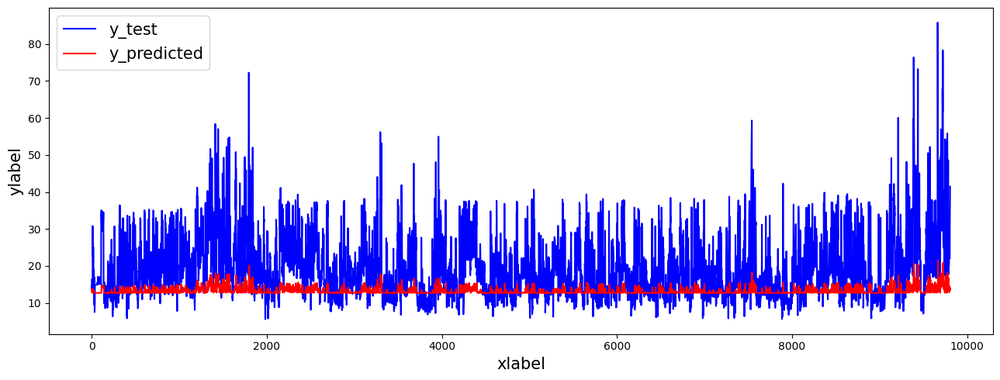

In [21]:
grus2s_shifted_3 = define_grus2s_model(n_past, n_future, X_train_shifted_3.shape[-1], y_train.shape[-1], "grus2s_shifted_3")

history = grus2s_shifted_3.fit(X_train_shifted_3, y_train_shifted_3,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_shifted_3 = grus2s_shifted_3.predict(X_test_shifted_3)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test_shifted_3[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred_shifted_3[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

#### Shifted 4

In [22]:
grus2s_shifted_4 = define_grus2s_model(n_past, n_future, X_train_shifted_4.shape[-1], y_train.shape[-1], "grus2s_shifted_4")

history = grus2s_shifted4.fit(X_train_shifted_4, y_train_shifted_4,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred_shifted_4 = grus2s_shifted4.predict(X_test_shifted_4)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test_shifted_4[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred_shifted_4[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

Model: "grus2s_shifted_4"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_9       │ (None, 168, 2)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_16 (GRU)        │ (None, 168, 128)  │     50,688 │ input_layer_9[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_17 (GRU)        │ [(None, 64),      │     37,248 │ gru_16[0][0]      │
│                     │ (None, 64)]       │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 64)        │          0 │ gru_17[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_18 (Dense)    │ (None, 32)        │      2,080 │ dropout_8[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ repeat_vector_9     │ (None, 4, 32)     │          0 │ dense_18[0][0]    │
│ (RepeatVector)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_18 (GRU)        │ (None, 4, 64)     │     18,816 │ repeat_vector_9[… │
│                     │                   │            │ gru_17[0][1]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_19 (GRU)        │ (None, 4, 128)    │     74,496 │ gru_18[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_9 (Dropout) │ (None, 4, 128)    │          0 │ gru_19[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ time_distributed_9  │ (None, 4, 1)      │        129 │ dropout_9[0][0]   │
│ (TimeDistributed)   │                   │            │                   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 183,457 (716.63 KB)

 Trainable params: 183,457 (716.63 KB)

 Non-trainable params: 0 (0.00 B)

None

NameError: name 'grus2s_shifted4' is not defined

In [ ]:
stop

### CNN-LSTM Seq2seq

In [ ]:
# Encoder layers
encoder_inputs = Input(shape=(n_past, n_features))
encoder_cnn_1 = Conv1D(filters=128, kernel_size=2, activation="relu")(encoder_inputs)
encoder_max_pooling_1 = MaxPooling1D(pool_size=2)(encoder_cnn_1)
encoder_cnn_2 = Conv1D(filters=64, kernel_size=2, activation="relu")(encoder_max_pooling_1)
encoder_max_pooling_2 = MaxPooling1D(pool_size=2)(encoder_cnn_2)
encoder_lstm, state_h, state_c = LSTM(64, return_state=True, activation="relu")(encoder_max_pooling_2)
encoder_dropout = Dropout(0.2)(encoder_lstm)
encoder_dense = Dense(latent_dim)(encoder_dropout)
# Repeat layer
decoder_repeat_vector = RepeatVector(n_future)(encoder_dense)
# Decoder layers
decoder_lstm_1 = LSTM(64, return_sequences=True, activation="relu")(decoder_repeat_vector, initial_state=[state_h, state_c])
decoder_dropout = Dropout(0.2)(decoder_lstm_1)
decoder_outputs = TimeDistributed(Dense(n_label))(decoder_dropout)
# Compile the model
cnncnnlstms2smodel = Model(encoder_inputs, decoder_outputs)
# Compile the model
cnnlstms2smodel = Model(encoder_inputs, decoder_outputs)
cnnlstms2smodel.compile(optimizer=Adam(learning_rate=0.001), loss=MeanSquaredError())
display(cnnlstms2smodel.summary())

# Fit model
history = cnnlstms2smodel.fit(X_train, y_train,
                epochs=epochs,
                batch_size=batch_size,
                validation_split=0.2,
                shuffle=False,
                callbacks = [
                    #EarlyStopping(monitor='val_loss', min_delta=0, patience=5, verbose=1, restore_best_weights=True),
                    TqdmCallback(verbose=1)
                ],
                verbose=1)
plot_learning_curves(history)

# Predict data
y_pred = cnnlstms2smodel.predict(X_test)

# Evaluation
for day in range(n_future):
    print(f"Day = {day}")
    inv_y_test = label_scaler.inverse_transform(y_test[:, day, :])[:-(day+1)]
    inv_y_pred = label_scaler.inverse_transform(y_pred[:, day, :])[(day+1):]
    for metric, calculator in metrics_calculators.items():
        print(f"{metric}: {calculator(inv_y_pred, inv_y_test)}")
    plot_2_data(data1=inv_y_test, datalabel1="y_test", data2=inv_y_pred, datalabel2="y_predicted")

## Evaluation board

In [ ]:
pd.DataFrame(evaluation_board)